<a href="https://colab.research.google.com/github/pastenar/RA_AJou/blob/main/LayoutParser-OCR_hojaServicio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Instalando e importar librerias.

Este bloque de codigo deber correrse más de una vez según lo solicite al correrlo la primera vez.

In [ ]:
# Instalar Tesseract y sus dependencias
!apt-get install tesseract-ocr
!apt-get install tesseract-ocr-spa
!pip install pytesseract

# Instalar OpenCV y otras dependencias básicas
!pip install opencv-python-headless
!pip install numpy pandas

# Instalar Layout Parser y sus dependencias
!pip install layoutparser
# !pip install "detectron2@git+https://github.com/facebookresearch/detectron2.git"
!pip install "git+https://github.com/facebookresearch/detectron2.git@v0.5#egg=detectron2"
!pip install 'pyyaml>=5.1'

# Verificar la instalación de Tesseract
!tesseract --version

# Instalar pdf2image y dependencias
!pip install pdf2image
!apt-get install poppler-utils

# Instala una version desactualizada de pillow, ya que el detectron2 de layout_parser usa alguna función que
# ya no existe en pillow y genera el < AttributeError: module 'PIL.Image' has no attribute 'LINEAR' >
# (debería usar 'BILINEAR')
!pip install pillow==9.5.0


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr-spa is already the newest version (1:4.00~git30-7274cfa-1.1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.
  Cloning https://github.com/facebookresearch/detectron2.git (to revision v0.5) to /tmp/pip-install-_7vg4cjs/detectron2_d75690d48dfd4faf932ac9eae92c6e52
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-install-_7vg4cjs/detectron2_d75690d48dfd4faf932ac9eae92c6e52
  Running command git checkout -q 82a57ce0b70057685962b352535147d9a8118578
  Resolved https://github.com/facebookresearch/detectron2.git to commit 82a57ce0b70057685962b352535147d9a8118578
  Preparing metadata (

In [ ]:
# Importar las bibliotecas necesarias
import layoutparser as lp
import pytesseract
import cv2

from pdf2image import convert_from_path
from google.colab import files

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import regex as re

from IPython.display import display
from PIL import Image

# Configurar ruta de Tesseract (específico para Colab)
pytesseract.pytesseract.tesseract_cmd = '/usr/bin/tesseract'

# Subir el archivo pdf y transformarlo en imagen '.jpg'

In [ ]:
# Sube el archivo
# El codigo abre una ventana para subir el archivo desde local
uploaded = files.upload()

# Convierte el PDF a imágenes (si es necesario)
pdf_path = list(uploaded.keys())[0]  # Nombre del archivo subido
images = convert_from_path(pdf_path)

# Guarda las imágenes en la sesión
for i, img in enumerate(images):
    img.save(f"page_{i+1}.jpg", "JPEG")

Saving ejemploHojaServicio.pdf to ejemploHojaServicio (1).pdf


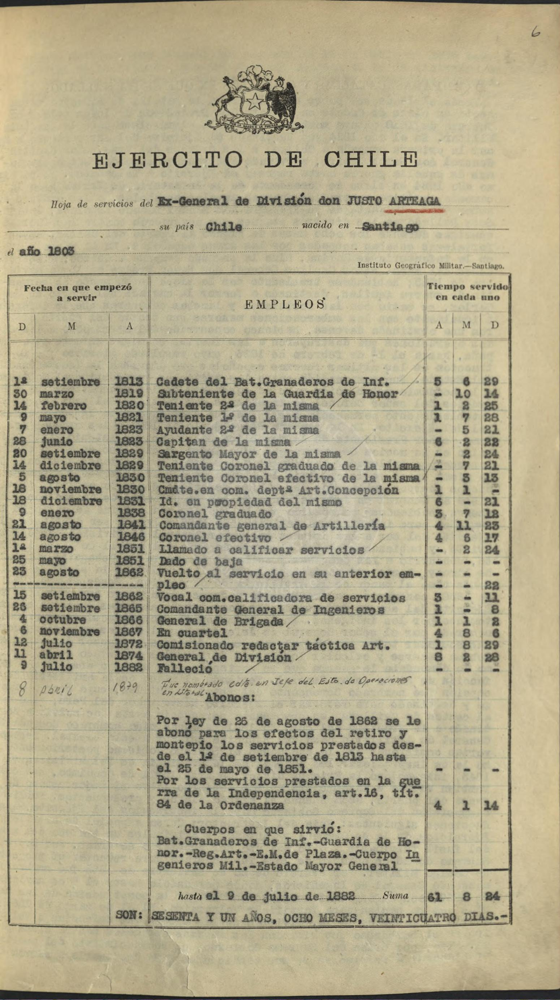

In [ ]:
# Mostrar cada imagen generada (páginas)
for i in range(len(images)):
    img = Image.open(f"page_{i+1}.jpg")
    display(img)

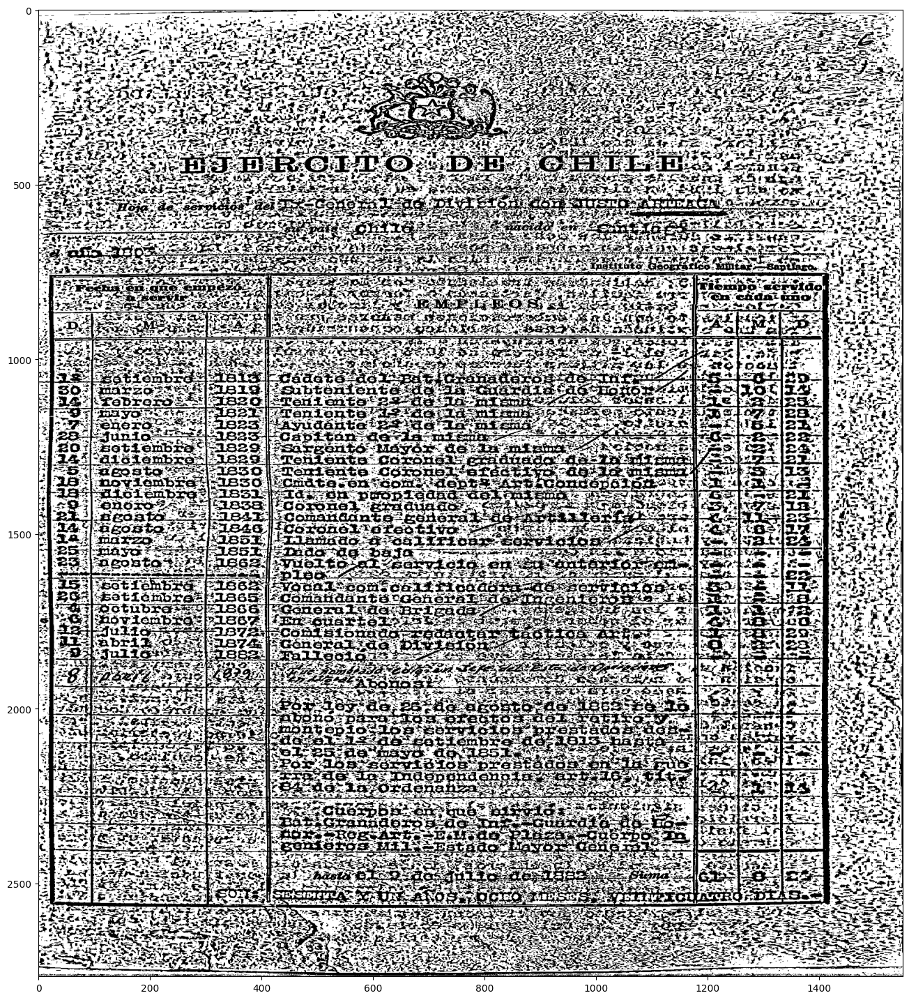

In [ ]:
# cargar la imagen guardada en la sesión
image = cv2.imread('page_1.jpg')

# transformación a gris
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
clahe = cv2.createCLAHE(clipLimit=10, tileGridSize=(8,8))
gray = clahe.apply(gray)

'''
Las dos últimas opciones de cv2.adaptiveThreshold corresponden a:
  - BlockSize determines the size of the neighbourhood area
  - C is a constant that is subtracted from the mean or weighted sum of the neighbourhood pixels.

Sirven para regular la sensibilidad del algoritmo y cambiar el resultado de la imagen.
documentación: https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html

mejores combinaciones de (blocksize, c):
  - 23,7
  - 21,5

'''
binary = cv2.adaptiveThreshold(
    gray,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,
    23,
    7
)

# quitar ruido y procesar a gris
# denoised = cv2.fastNlMeansDenoising(binary)
processed_img = cv2.cvtColor(denoised, cv2.COLOR_GRAY2BGR)

# tamaño de la figura y mostrar
plt.figure(figsize=(16, 18))
plt.imshow(processed_img, aspect='auto')


# Detección de bloques con el DL de Layout Parser

El modelo preentrenado cuenta con diferentes datos disponibles para usar, corresponde al string del primer argumento de `lp.Detectron2LayoutModel`. Otros modelos [aquí](https://layout-parser.readthedocs.io/en/latest/notes/modelzoo.html).


El label_map corresponde a la clasificación dada a los bloques detectados y están directamente asociados al modelo usado. Otras mapeos se pueden ver [aquí](https://layout-parser.readthedocs.io/en/latest/notes/modelzoo.html).


Algunos modelos a usar son:

  - HJDataset: entrenado en base a documentos historicos japoneses.

    - `lp://HJDataset/mask_rcnn_R_50_FPN_3x/config`
    - `lp://HJDataset/retinanet_R_50_FPN_3x/config`

  label map: `{1:"Page Frame", 2:"Row", 3:"Title Region", 4:"Text Region", 5:"Title", 6:"Subtitle", 7:"Other"}`

  - TableBank: entrenado para reconocer exclusivamente tablas

    - `lp://TableBank/faster_rcnn_R_101_FPN_3x/config`

  label map: `{0: "Table"}`

  - PubLayNet: Usa PubMed Central Open Access Subset como fuente de datos.

    - `lp://PubLayNet/mask_rcnn_X_101_32x8d_FPN_3x/config`  

  label map: `{0: "Text", 1: "Title", 2: "List", 3:"Table", 4:"Figure"}`


Los mejores resultados son de PubLayNey y TableBank (pero solo reconoce la tabla). Sin embargo, se pueden probar otros modelos y configuraciones para obtener resultados mejores o específicos.

/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

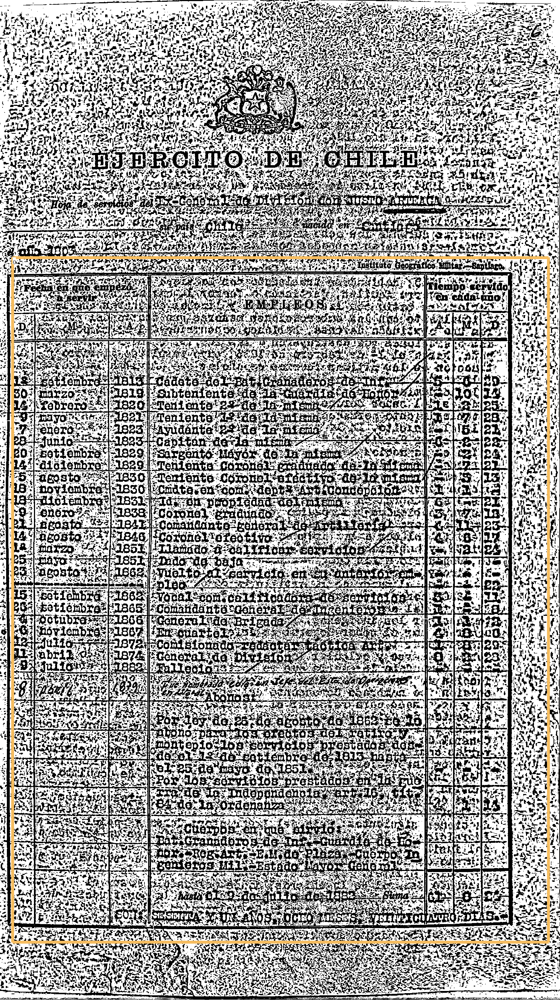

In [ ]:
# Copiar aquí el modeo a usar
modelo_preentrenado = 'lp://TableBank/faster_rcnn_R_101_FPN_3x/config'

# asigna label_map según el modelo
if bool(re.search('HJDataset', modelo_preentrenado))==True:
  label_map = {1:"Page Frame", 2:"Row", 3:"Title Region", 4:"Text Region", 5:"Title", 6:"Subtitle", 7:"Other"}
elif bool(re.search('TableBank', modelo_preentrenado))==True:
  label_map = {0: "Table"}
elif bool(re.search('PubLayNet', modelo_preentrenado))==True:
  label_map = {0: "Text", 1: "Title", 2: "List", 3:"Table", 4:"Figure"}
else:
  label_map = None
  print('label map no asignado, modelo inválido')

model = lp.Detectron2LayoutModel(
    modelo_preentrenado,
    label_map=label_map
)

layout = model.detect(processed_img)

# Visualizar los bloques en la imagen
lp.draw_box(processed_img, layout, box_width=8, show_element_id=True)


El modelo crea un layout sobre la imagen, el siguiente codigo es para manipular los elementos del layout.

 La siguiente tabla muestra  el tamaño, score y tipo (segun el label map) de los bloques detectados


In [ ]:
# Asignar ids a los bloques:
for i, block in enumerate(layout):
  block.set(id=i, inplace=True)

layout_info = {'id':[], 'type':[], 'x_width':[], 'y_height':[], 'score':[]}

for i, block in enumerate(layout):
    # Agregar id usando enumerate para que sea único
    layout_info['id'].append(i)
    layout_info['type'].append(block.type)
    # Calcula el ancho y alto para cada bloque individual
    layout_info['x_width'].append(block.block.x_2 - block.block.x_1)
    layout_info['y_height'].append(block.block.y_2 - block.block.y_1)
    layout_info['score'].append(block.score)

# Crear el DataFrame de pandas
df = pd.DataFrame(layout_info)

df.head(20)

,id,type,x_width,y_height,score
0,0,Table,1481.367138,1895.007996,0.784302


Ahora se separan los objetos del layout sobre un umbral para el score para poder mostrarlos por separado.

**ATENCION al umbral/threshold asignado, ya que según el modelo cambian muchos los scores**

In [ ]:
# Separa el array de bloques a por sus clasificaciones

# Agrega un filtro por score
threshold = 0

if bool(re.search('HJDataset', modelo_preentrenado))==True:
  page_blocks = lp.Layout([b for b in layout if b.type=='Page Frame' and b.score>=threshold])
  row_blocks = lp.Layout([b for b in layout if b.type=='Row' and b.score>=threshold])
  title_blocks = lp.Layout([b for b in layout if b.type=='Title Region' and b.score>=threshold])
  text_blocks = lp.Layout([b for b in layout if b.type=='Text Region' and b.score>=threshold])
  titles = lp.Layout([b for b in layout if b.type=='Title' and b.score>=threshold])
  sbbtitles = lp.Layout([b for b in layout if b.type=='Subtitle' and b.score>=threshold])
  other = lp.Layout([b for b in layout if b.type=='Other' and b.score>=threshold])
elif bool(re.search('TableBank', modelo_preentrenado))==True:
  table_blocks = lp.Layout([b for b in layout if b.type=='Table' and b.score>=threshold])
elif bool(re.search('PubLayNet', modelo_preentrenado))==True:
  text_blocks = lp.Layout([b for b in layout if b.type=='Text' and b.score>=threshold])
  title_blocks = lp.Layout([b for b in layout if b.type=='Title' and b.score>=threshold])
  list_blocks = lp.Layout([b for b in layout if b.type=='List' and b.score>=threshold])
  table_blocks = lp.Layout([b for b in layout if b.type=='Table' and b.score>=threshold])
  figure_blocks = lp.Layout([b for b in layout if b.type=='Figure' and b.score>=threshold])
else:
  print('Bloques no asignados, modelo inválido')


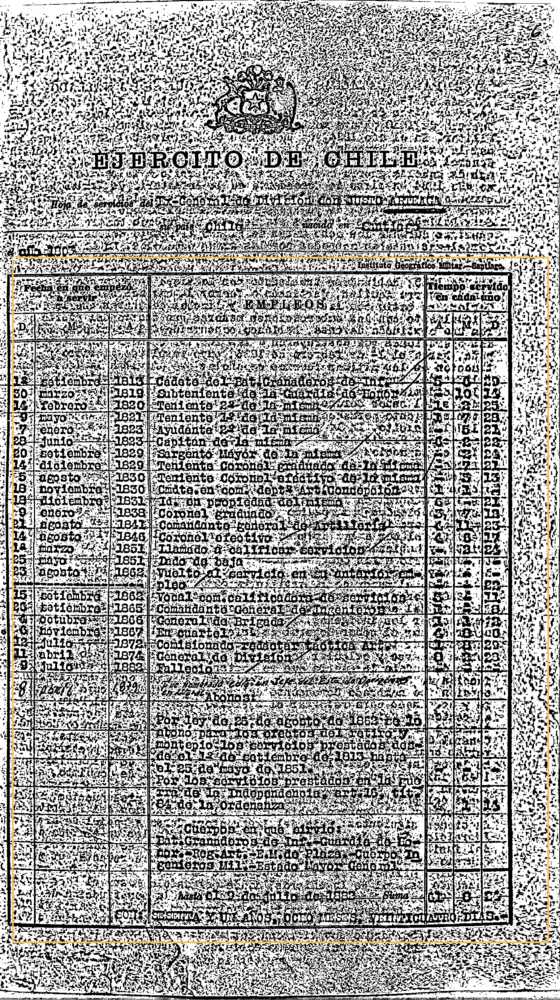

In [ ]:
# Visualizar según tipo de bloque
lp.draw_box(processed_img, table_blocks,
            box_width=5,
            show_element_id=True)

### Obtener el texto dentro de cada bloque

In [ ]:
ocr_agent = lp.TesseractAgent(languages='spa')

'''
languages disponibles Tesseract version 4.0.0 +
      spa        : Spanish Castilian
      spa_old    : Spanish Castilian - Old
'''

'\nlanguages disponibles Tesseract version 4.0.0 +\n      spa        : Spanish Castilian\n      spa_old    : Spanish Castilian - Old\n'

In [ ]:
for block in table_blocks:
    segment_image = (block
                       .pad(left=5, right=5, top=5, bottom=5)
                       .crop_image(image))
        # add padding in each image segment can help
        # improve robustness

    text = ocr_agent.detect(segment_image)
    block.set(text=text, inplace=True)


In [ ]:
results = []

for block in table_blocks:
    # coordenadas
    x1, y1, x2, y2 = block.coordinates

    # Seleccionar región de la imagen
    region = image[int(y1):int(y2), int(x1):int(x2)]

    # Convert to PIL Image for Tesseract
    pil_image = Image.fromarray(region)

    # Extraer texto
    text = pytesseract.image_to_string(pil_image, lang='spa')

    results.append({
        'type': block.type,
        'text': text.strip(),
    })


In [ ]:
texto = results[0]['text']
texto

'Fecha en que empezó\n\na servir\n\n \n\n \n\n \n\n \n\n \n\n \n\n \n\nE EMPLEOS\nD M A\n— =: Er\n12 setiembre | 1813 Cadete del Pat.Granaderos de Inf.  -\n30 [marzo 1819 | Subteniente de la Guardia A Top\n14 febrero  |1820| Teniente 22 de la misma\n9 ¡mayo 1821 Teniente 1? de la misma\n7 | enero 1823 | Ayudante 2% de la misma\n28 jun 1823 | Capitan de la misma -\n20 | setiembre 1829 Sargento Mayor de la misma /\n14 |diciembre | 1829 | Teniente Coronel graduado de la misma\n5 agosto 1830 Teniente Coronel efectivo de la misma\n18 | noviembre | 1830 Cmáte.en com. dept2 Art.Concepción\n18 | diciembre | 1831 Té. en propiedad del mismo\n9 | enero 1838 |Coronel graduado\n21 | agosto 1841 | Comandante general de Artillería\n14 | agosto 1846 | Coronel efectivo —\n12 marzo 1851 | Llamado a calificar servicios.\n25 | mayo 1851 | Dado de baja\n23 | agosto 1862 | Vuelto al servicio en su anterior em-\nPp | PAGO\n15 | setiembre Vocal entáfricacora de as\n26 | setiembre Comandante General de Ingenie

Procesando texto obtenido

In [ ]:
# Lista para almacenar los datos procesados
data = []

# Expresión regular para capturar día, mes, año y el resto del texto
regex = r"(\d{1,2})\s*[|\s]+(\w+)\s*[|\s]+(\d{4})\s*[|\s]*(.+)"

# Procesar cada línea del texto
for linea in texto.splitlines():
    linea = linea.strip()
    if linea:  # Ignorar líneas vacías
        match = re.match(regex, linea)
        if match:
            dia, mes, anio, resto = match.groups()
            data.append([int(dia), mes, int(anio), resto])

# Crear el DataFrame
columnas = ["Día", "Mes", "Año", "Información"]
df = pd.DataFrame(data, columns=columnas)

# Mostrar el DataFrame
print(df)

# Guardar el DataFrame a un archivo CSV (opcional)
df.to_csv("datos_procesados.csv", index=False)


    Día        Mes   Año                            Información
0    12  setiembre  1813   Cadete del Pat.Granaderos de Inf.  -
1    14    febrero  1820                Teniente 22 de la misma
2     7      enero  1823                Ayudante 2% de la misma
3    28        jun  1823                  Capitan de la misma -
4    20  setiembre  1829           Sargento Mayor de la misma /
5    14  diciembre  1829  Teniente Coronel graduado de la misma
6     5     agosto  1830  Teniente Coronel efectivo de la misma
7    18  noviembre  1830     Cmáte.en com. dept2 Art.Concepción
8    18  diciembre  1831             Té. en propiedad del mismo
9     9      enero  1838                       Coronel graduado
10   21     agosto  1841       Comandante general de Artillería
11   14     agosto  1846                     Coronel efectivo —
12   12      marzo  1851         Llamado a calificar servicios.
13   25       mayo  1851                           Dado de baja
14   23     agosto  1862  Vuelto al serv